In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
from scipy.stats import zscore
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

In [2]:
#Lets Load the Data Set

df = pd.read_csv("winequality-red.csv")

In [3]:
df.head()


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [4]:
#Changing the Column Name

df.rename(columns={'fixed acidity': 'fixed_acidity', 'volatile acidity': 'volatile_acidity','citric acid': 'citric_acid', 'residual sugar': 'residual_sugar','free sulfur dioxide': 'free_sulfur_dioxide', 'total sulfur dioxide': 'total_sulfur_dioxide'}, inplace=True)


In [5]:
#Exploratory Data Analysis (EDA)

#checking the shape of dataset
print("There are {} rows and {} columns respectively present in the dataset.".format(*df.shape))


There are 1599 rows and 12 columns respectively present in the dataset.


In [6]:
# checking columns in Dataset
print("these are the columns present in the dataset:  \n\n",df.columns)


these are the columns present in the dataset:  

 Index(['fixed_acidity', 'volatile_acidity', 'citric_acid', 'residual_sugar',
       'chlorides', 'free_sulfur_dioxide', 'total_sulfur_dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality'],
      dtype='object')


In [7]:
# checking duplicate values in the dataset
print("There are {} duplicates present in the dataset".format(df.duplicated().sum()))


There are 240 duplicates present in the dataset


In [8]:
# Droping Dupilicate Values
df.drop_duplicates(inplace=True)

In [9]:
df.duplicated().sum()

0

In [10]:
#checking null values in Dataset
df.isnull().sum()

fixed_acidity           0
volatile_acidity        0
citric_acid             0
residual_sugar          0
chlorides               0
free_sulfur_dioxide     0
total_sulfur_dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

<Axes: >

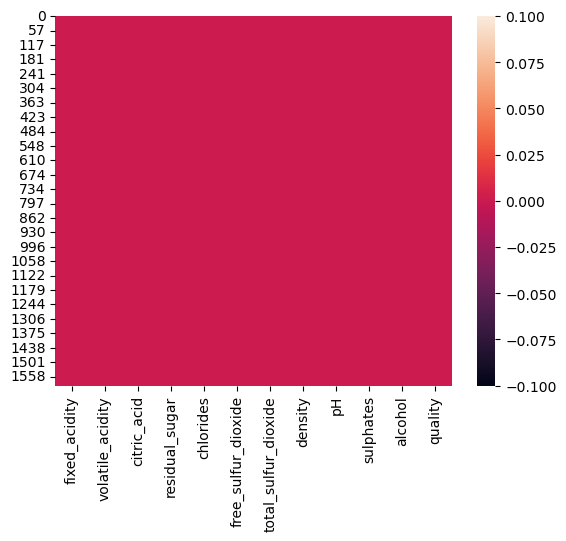

In [11]:
sns.heatmap(df.isnull())

In [12]:
# checking information about dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1359 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed_acidity         1359 non-null   float64
 1   volatile_acidity      1359 non-null   float64
 2   citric_acid           1359 non-null   float64
 3   residual_sugar        1359 non-null   float64
 4   chlorides             1359 non-null   float64
 5   free_sulfur_dioxide   1359 non-null   float64
 6   total_sulfur_dioxide  1359 non-null   float64
 7   density               1359 non-null   float64
 8   pH                    1359 non-null   float64
 9   sulphates             1359 non-null   float64
 10  alcohol               1359 non-null   float64
 11  quality               1359 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 138.0 KB


In [13]:
# Describing the Dataset
df.describe()

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
count,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000
mean,8.310596,0.529478,0.272333,2.523400,0.088124,15.893304,46.825975,0.996709,3.309787,0.658705,10.432315,5.623252
std,1.736990,0.183031,0.195537,1.352314,0.049377,10.447270,33.408946,0.001869,0.155036,0.170667,1.082065,0.823578
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996700,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.430000,2.600000,0.091000,21.000000,63.000000,0.997820,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


OBSERVATION:

The dataset contains 1359 rows and 12 columns.
The "fixed acidity" column has a mean value of 8.310596 and a standard deviation of 1.736990.
The range of values for "fixed acidity" is from 4.6 to 15.9.
The other chemical properties also exhibit varying means, standard deviations, minimum, and maximum values.
The "quality" column ranges from 3 to 8, representing the quality rating of the wine.
The dataset provides insights into the distribution and characteristics of the wine dataset, aiding the understanding of the range and variability of different chemical properties.
The variability in acidity, as indicated by the "fixed acidity" column, can be a significant factor in determining the taste, quality, and overall characteristics of the wine.

In [15]:
#checking skewness

from scipy.stats import skew


df.apply(skew)

fixed_acidity           0.940002
volatile_acidity        0.728474
citric_acid             0.312380
residual_sugar          4.543132
chlorides               5.496412
free_sulfur_dioxide     1.225225
total_sulfur_dioxide    1.538667
density                 0.044728
pH                      0.231776
sulphates               2.403848
alcohol                 0.858892
quality                 0.192194
dtype: float64

In [16]:
# checking unique values
df.nunique()

fixed_acidity            96
volatile_acidity        143
citric_acid              80
residual_sugar           91
chlorides               153
free_sulfur_dioxide      60
total_sulfur_dioxide    144
density                 436
pH                       89
sulphates                96
alcohol                  65
quality                   6
dtype: int64

In [17]:
# value_count of quality column
df['quality'].value_counts()

5    577
6    535
7    167
4     53
8     17
3     10
Name: quality, dtype: int64

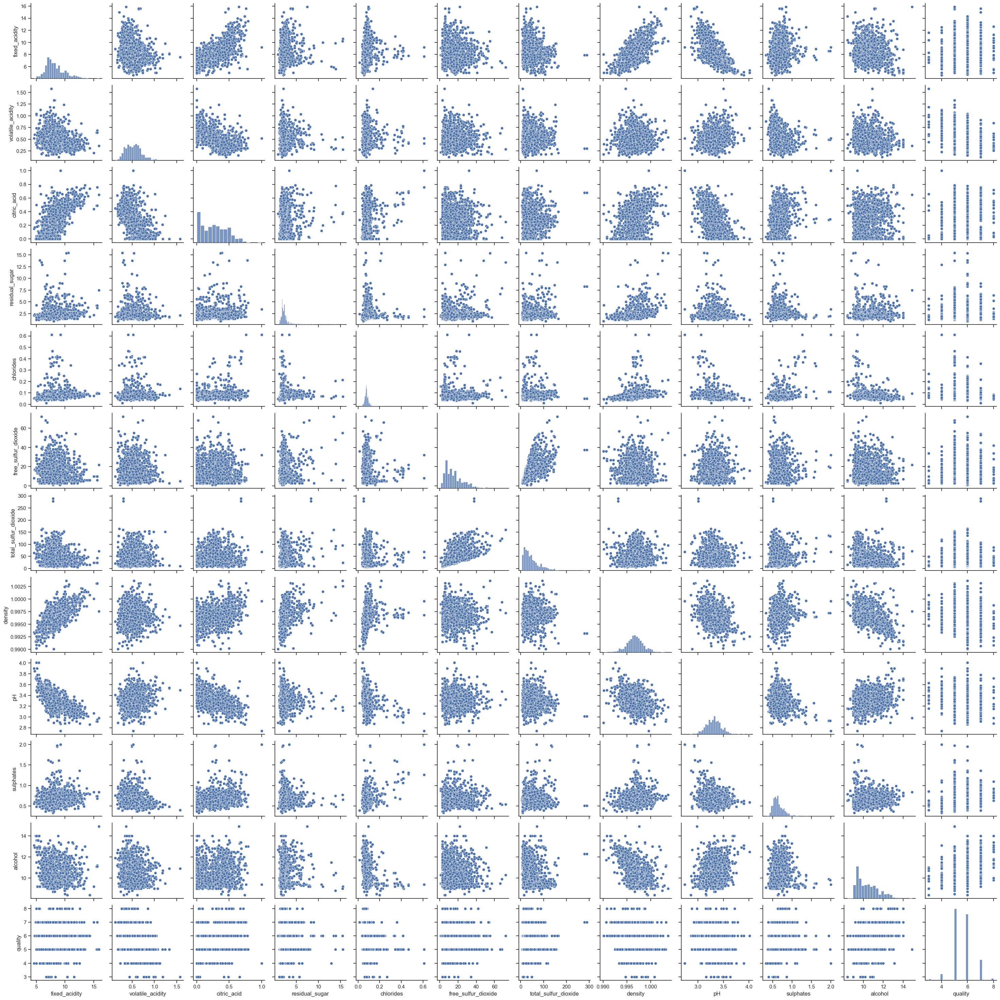

In [18]:
#VISUALIZATION
#Plotting Pairplot


sns.set(style='ticks')
sns.pairplot(df)
plt.show()

In [21]:
import pickle
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from scipy import stats
import scipy.stats as stats
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split,GridSearchCV,cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier,ExtraTreesClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score,recall_score, f1_score
from sklearn.metrics import roc_auc_score,roc_curve



#Plotting Plotly Countplot For all columns for Better Visualization
# plotly count plot

for column in df.columns:
    fig = px.histogram(df, x=column)
    fig.update_layout(title=f"Count Plot of {column}", xaxis_title=column, yaxis_title="Count")
    fig.show()

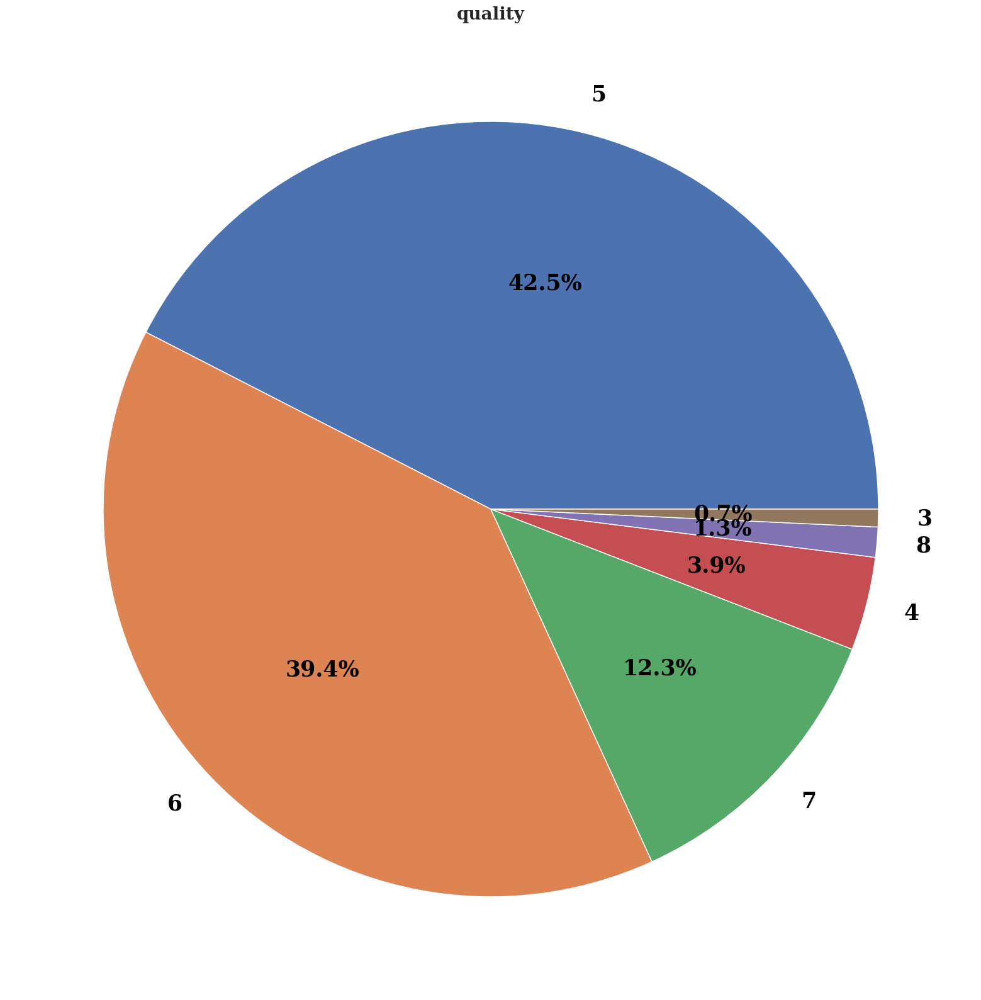

In [22]:
#Plotting Pyplot For Quality Column

# checking distribution of quality with pyplot
plt.figure(figsize=(30,20)) 
plt.pie(df['quality'].value_counts(), labels=df['quality'].value_counts().index, autopct='%1.1f%%', textprops={ 'fontsize': 25,
                                           'color': 'black',
                                           'weight': 'bold',
                                           'family': 'serif' }) 
hfont = {'fontname':'serif', 'weight': 'bold'}
plt.title('quality', size=20, **hfont) 
plt.show()

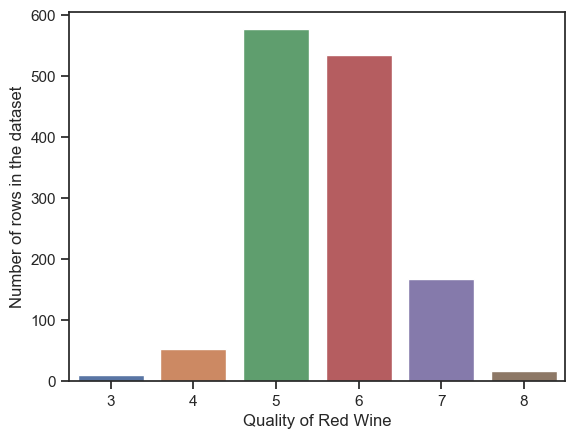

In [23]:
#Plotting CountPlot for quality column


sns.countplot(x ='quality', data = df)
plt.xlabel('Quality of Red Wine')
plt.ylabel('Number of rows in the dataset')
plt.show()

In [24]:
#Plotting Distribution Plot for all the columns

for column in df.columns:
    fig = ff.create_distplot([df[column]], [column], bin_size=0.5, show_rug=False)

    fig.update_layout(
        title=column,
        xaxis_title="Value",
        yaxis_title="Density"
    )

    fig.show()

In [25]:
#Removing Skewness by Cube Root Transformation

# Specify the columns to transform
columns_to_transform = ['fixed_acidity', 'volatile_acidity',  'residual_sugar',
       'chlorides', 'free_sulfur_dioxide', 'total_sulfur_dioxide', 
        'sulphates']

# Apply cube root transformation to the selected columns
df[columns_to_transform] = df[columns_to_transform].apply(lambda x: np.cbrt(x))


df

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
0,1.948695,0.887904,0.00,1.238562,0.423582,2.223980,3.239612,0.99780,3.51,0.824257,9.4,5
1,1.983192,0.958284,0.00,1.375069,0.461044,2.924018,4.061548,0.99680,3.20,0.879366,9.8,5
2,1.983192,0.912581,0.04,1.320006,0.451436,2.466212,3.779763,0.99700,3.26,0.866239,9.8,5
3,2.237378,0.654213,0.56,1.238562,0.421716,2.571282,3.914868,0.99800,3.16,0.833955,9.8,6
5,1.948695,0.870659,0.00,1.216440,0.421716,2.351335,3.419952,0.99780,3.51,0.824257,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1593,1.894536,0.852702,0.08,1.238562,0.408166,3.036589,3.361975,0.99651,3.42,0.935990,9.5,6
1594,1.837091,0.843433,0.08,1.259921,0.448140,3.174802,3.530348,0.99490,3.45,0.833955,10.5,5
1595,1.806969,0.819321,0.10,1.300591,0.395789,3.391211,3.708430,0.99512,3.52,0.912581,11.2,6
1597,1.806969,0.864012,0.12,1.259921,0.421716,3.174802,3.530348,0.99547,3.57,0.892112,10.2,5


In [26]:
for column in df.columns:
    fig = ff.create_distplot([df[column]], [column], bin_size=0.5, show_rug=False)

    fig.update_layout(
        title=column,
        xaxis_title="Value",
        yaxis_title="Density"
    )

    fig.show()

In [28]:
#Handling Outliers Using Z score

z=np.abs(zscore(df))
threshold=3
np.where(z>3)

df=df[(z<3).all(axis=1)]
df

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
0,1.948695,0.887904,0.00,1.238562,0.423582,2.223980,3.239612,0.99780,3.51,0.824257,9.4,5
1,1.983192,0.958284,0.00,1.375069,0.461044,2.924018,4.061548,0.99680,3.20,0.879366,9.8,5
2,1.983192,0.912581,0.04,1.320006,0.451436,2.466212,3.779763,0.99700,3.26,0.866239,9.8,5
3,2.237378,0.654213,0.56,1.238562,0.421716,2.571282,3.914868,0.99800,3.16,0.833955,9.8,6
5,1.948695,0.870659,0.00,1.216440,0.421716,2.351335,3.419952,0.99780,3.51,0.824257,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1593,1.894536,0.852702,0.08,1.238562,0.408166,3.036589,3.361975,0.99651,3.42,0.935990,9.5,6
1594,1.837091,0.843433,0.08,1.259921,0.448140,3.174802,3.530348,0.99490,3.45,0.833955,10.5,5
1595,1.806969,0.819321,0.10,1.300591,0.395789,3.391211,3.708430,0.99512,3.52,0.912581,11.2,6
1597,1.806969,0.864012,0.12,1.259921,0.421716,3.174802,3.530348,0.99547,3.57,0.892112,10.2,5


In [29]:
#Checking Correlation


df_corr = df.corr()
df_corr

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
fixed_acidity,1.000000,-0.289972,0.690966,0.205839,0.199276,-0.148897,-0.092473,0.669176,-0.718759,0.216631,-0.036810,0.140731
volatile_acidity,-0.289972,1.000000,-0.586711,0.048431,0.135916,0.029119,0.122163,0.018287,0.249050,-0.331314,-0.223373,-0.379191
citric_acid,0.690966,-0.586711,1.000000,0.173398,0.084503,-0.088228,-0.004232,0.362982,-0.531726,0.315501,0.158970,0.246903
residual_sugar,0.205839,0.048431,0.173398,1.000000,0.192686,0.027935,0.098093,0.373642,-0.090034,0.067676,0.137654,0.034331
chlorides,0.199276,0.135916,0.084503,0.192686,1.000000,-0.000452,0.112009,0.368570,-0.197363,0.025628,-0.256930,-0.161784
free_sulfur_dioxide,-0.148897,0.029119,-0.088228,0.027935,-0.000452,1.000000,0.754455,-0.021641,0.104242,0.039955,-0.108406,-0.075608
total_sulfur_dioxide,-0.092473,0.122163,-0.004232,0.098093,0.112009,0.754455,1.000000,0.138214,-0.009247,-0.012765,-0.283042,-0.218200
density,0.669176,0.018287,0.362982,0.373642,0.368570,-0.021641,0.138214,1.000000,-0.324757,0.156166,-0.477571,-0.170918
pH,-0.718759,0.249050,-0.531726,-0.090034,-0.197363,0.104242,-0.009247,-0.324757,1.000000,-0.058710,0.142764,-0.080126
sulphates,0.216631,-0.331314,0.315501,0.067676,0.025628,0.039955,-0.012765,0.156166,-0.058710,1.000000,0.237466,0.386120


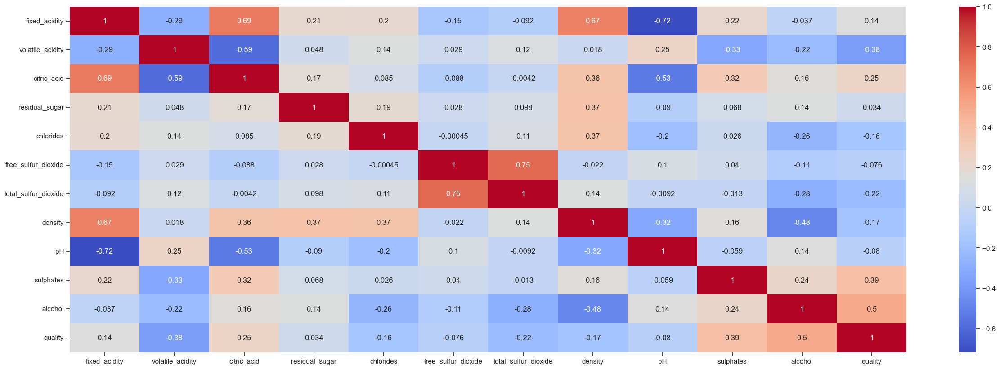

In [30]:
#HEATMAP

plt.figure(figsize=(30, 10))
sns.heatmap(df_corr, annot=True, cmap='coolwarm')
plt.show()

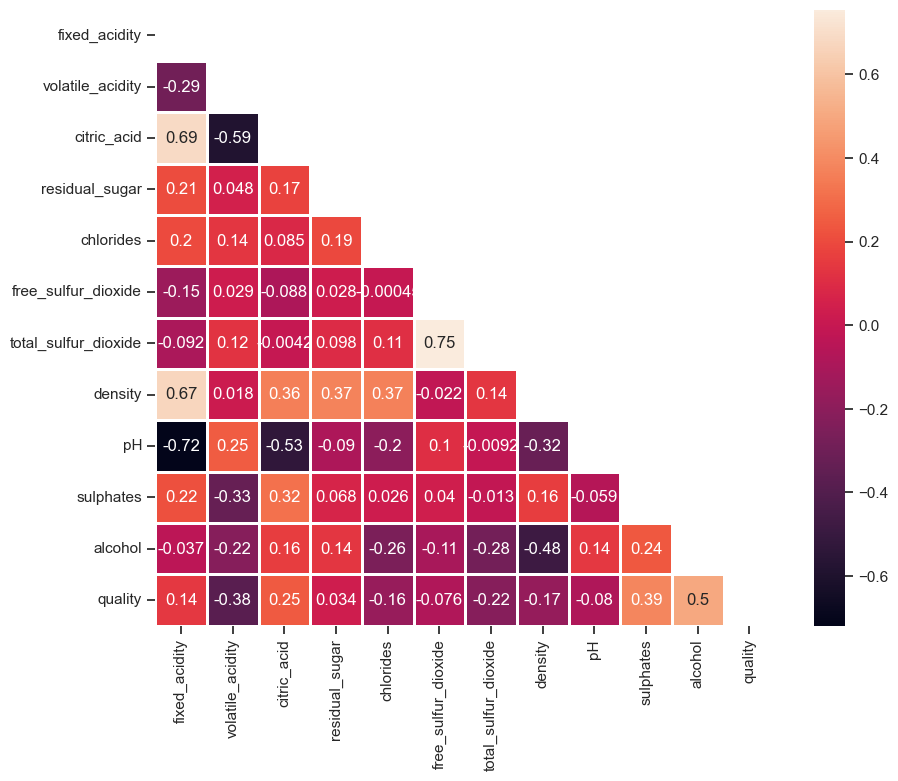

In [31]:
#Plotting Heatmap

plt.figure(figsize=(10, 8))
matrix = np.triu(df_corr)
sns.heatmap(df_corr, annot=True, linewidth=.8, mask=matrix, cmap="rocket");
plt.show()

In [32]:
#Checking Correlation of all features with Target Column

correlation_with_quality = df.corr()['quality'].abs().sort_values(ascending=False)
print(correlation_with_quality)

quality                 1.000000
alcohol                 0.500876
sulphates               0.386120
volatile_acidity        0.379191
citric_acid             0.246903
total_sulfur_dioxide    0.218200
density                 0.170918
chlorides               0.161784
fixed_acidity           0.140731
pH                      0.080126
free_sulfur_dioxide     0.075608
residual_sugar          0.034331
Name: quality, dtype: float64


In [33]:
#Checking Correlation of Column with Column

df_corr

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
fixed_acidity,1.000000,-0.289972,0.690966,0.205839,0.199276,-0.148897,-0.092473,0.669176,-0.718759,0.216631,-0.036810,0.140731
volatile_acidity,-0.289972,1.000000,-0.586711,0.048431,0.135916,0.029119,0.122163,0.018287,0.249050,-0.331314,-0.223373,-0.379191
citric_acid,0.690966,-0.586711,1.000000,0.173398,0.084503,-0.088228,-0.004232,0.362982,-0.531726,0.315501,0.158970,0.246903
residual_sugar,0.205839,0.048431,0.173398,1.000000,0.192686,0.027935,0.098093,0.373642,-0.090034,0.067676,0.137654,0.034331
chlorides,0.199276,0.135916,0.084503,0.192686,1.000000,-0.000452,0.112009,0.368570,-0.197363,0.025628,-0.256930,-0.161784
free_sulfur_dioxide,-0.148897,0.029119,-0.088228,0.027935,-0.000452,1.000000,0.754455,-0.021641,0.104242,0.039955,-0.108406,-0.075608
total_sulfur_dioxide,-0.092473,0.122163,-0.004232,0.098093,0.112009,0.754455,1.000000,0.138214,-0.009247,-0.012765,-0.283042,-0.218200
density,0.669176,0.018287,0.362982,0.373642,0.368570,-0.021641,0.138214,1.000000,-0.324757,0.156166,-0.477571,-0.170918
pH,-0.718759,0.249050,-0.531726,-0.090034,-0.197363,0.104242,-0.009247,-0.324757,1.000000,-0.058710,0.142764,-0.080126
sulphates,0.216631,-0.331314,0.315501,0.067676,0.025628,0.039955,-0.012765,0.156166,-0.058710,1.000000,0.237466,0.386120


In [34]:
#Here i am writing a function for seeing those columns which are highly correlated with other columns


correlation_threshold = 0.7
mask = df_corr.abs() >= correlation_threshold
features_to_drop = set()
for i in range(len(df_corr.columns)):
    for j in range(i+1, len(df_corr.columns)):
        if mask.iloc[i, j]:
            colname_i = df_corr.columns[i]
            colname_j = df_corr.columns[j]
            if colname_i not in features_to_drop:
                features_to_drop.add(colname_j)

In [35]:
features_to_drop

{'pH', 'total_sulfur_dioxide'}

In [36]:
#Dropping 'PH' and 'total sulfur dioxide'

df = df.drop(['pH', 'total_sulfur_dioxide'], axis = 1)

In [37]:
df.head()

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,density,sulphates,alcohol,quality
0,1.948695,0.887904,0.00,1.238562,0.423582,2.223980,0.9978,0.824257,9.4,5
1,1.983192,0.958284,0.00,1.375069,0.461044,2.924018,0.9968,0.879366,9.8,5
2,1.983192,0.912581,0.04,1.320006,0.451436,2.466212,0.9970,0.866239,9.8,5
3,2.237378,0.654213,0.56,1.238562,0.421716,2.571282,0.9980,0.833955,9.8,6
5,1.948695,0.870659,0.00,1.216440,0.421716,2.351335,0.9978,0.824257,9.4,5


In [39]:
#Assigning values >=7 to 1 and rest values to 0


df['quality_final'] = np.where(df['quality'] >= 7, 1, 0)

In [40]:
df.head()

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,density,sulphates,alcohol,quality,quality_final
0,1.948695,0.887904,0.00,1.238562,0.423582,2.223980,0.9978,0.824257,9.4,5,0
1,1.983192,0.958284,0.00,1.375069,0.461044,2.924018,0.9968,0.879366,9.8,5,0
2,1.983192,0.912581,0.04,1.320006,0.451436,2.466212,0.9970,0.866239,9.8,5,0
3,2.237378,0.654213,0.56,1.238562,0.421716,2.571282,0.9980,0.833955,9.8,6,0
5,1.948695,0.870659,0.00,1.216440,0.421716,2.351335,0.9978,0.824257,9.4,5,0


In [41]:
#Dropping Quality Column Beacause i have created a new column quality_final in place of quality

df = df.drop(['quality'], axis = 1)

In [42]:
df.head()

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,density,sulphates,alcohol,quality_final
0,1.948695,0.887904,0.00,1.238562,0.423582,2.223980,0.9978,0.824257,9.4,0
1,1.983192,0.958284,0.00,1.375069,0.461044,2.924018,0.9968,0.879366,9.8,0
2,1.983192,0.912581,0.04,1.320006,0.451436,2.466212,0.9970,0.866239,9.8,0
3,2.237378,0.654213,0.56,1.238562,0.421716,2.571282,0.9980,0.833955,9.8,0
5,1.948695,0.870659,0.00,1.216440,0.421716,2.351335,0.9978,0.824257,9.4,0


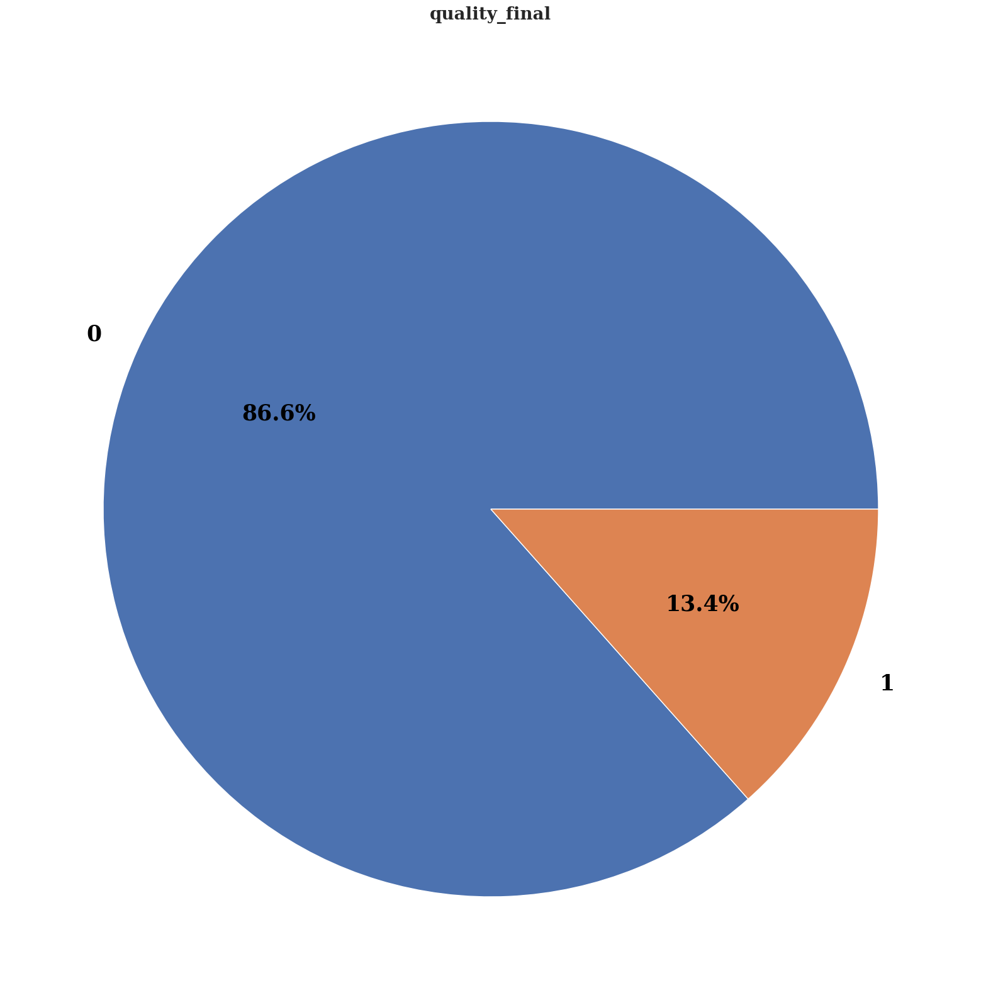

In [43]:
#Plotting Pyplot for quality_final Column

# checking distribution of quality with pyplot
plt.figure(figsize=(30,20)) 
plt.pie(df['quality_final'].value_counts(), labels=df['quality_final'].value_counts().index, autopct='%1.1f%%', textprops={ 'fontsize': 25,
                                           'color': 'black',
                                           'weight': 'bold',
                                           'family': 'serif' }) 
hfont = {'fontname':'serif', 'weight': 'bold'}
plt.title('quality_final', size=20, **hfont) 
plt.show()

In [44]:
#Scaling data Using StandardScaler


scaler = StandardScaler()
features_to_scale =['fixed_acidity', 'volatile_acidity', 'residual_sugar', 'free_sulfur_dioxide', 'density', 'sulphates', 'alcohol']
scaled_features = scaler.fit_transform(df[features_to_scale])
scaled_df = df.copy()
scaled_df[features_to_scale] = scaled_features

In [45]:
scaled_df

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,density,sulphates,alcohol,quality_final
0,-0.520695,0.988890,0.00,-0.627665,0.423582,-0.310894,0.643254,-0.616013,-0.990170,0
1,-0.258095,1.761182,0.00,0.396706,0.461044,1.021242,0.068316,0.339832,-0.603475,0
2,-0.258095,1.259670,0.04,-0.016496,0.451436,0.150061,0.183303,0.112152,-0.603475,0
3,1.676814,-1.575439,0.56,-0.627665,0.421716,0.350003,0.758241,-0.447804,-0.603475,0
5,-0.520695,0.799655,0.00,-0.793672,0.421716,-0.068545,0.643254,-0.616013,-0.990170,0
...,...,...,...,...,...,...,...,...,...,...
1593,-0.932962,0.602611,0.08,-0.627665,0.408166,1.235460,-0.098416,1.321961,-0.893496,0
1594,-1.370252,0.500899,0.08,-0.467385,0.448140,1.498472,-1.024066,-0.447804,0.073242,0
1595,-1.599544,0.236320,0.10,-0.162187,0.395789,1.910288,-0.897580,0.915928,0.749960,0
1597,-1.599544,0.726722,0.12,-0.467385,0.421716,1.498472,-0.696352,0.560911,-0.216779,0


In [50]:
#Deviding into Feature and Label

X = scaled_df.drop('quality_final', axis = 1)
y = scaled_df['quality_final']

In [51]:
#Data Balancing Using SMOTE

smote = SMOTE()
X_resampled, y_resampled = smote.fit_resample(X, y)

In [52]:
y_resampled.value_counts()

0    1088
1    1088
Name: quality_final, dtype: int64

In [53]:
#Train Test Split


X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, stratify = y_resampled, random_state=42)


Logistic Regression with Hyperparameter Tuning:
Classification Report:
              precision    recall  f1-score   support

           0       0.85      0.76      0.80       218
           1       0.78      0.86      0.82       218

    accuracy                           0.81       436
   macro avg       0.82      0.81      0.81       436
weighted avg       0.82      0.81      0.81       436

Cross-Validation Scores: [0.87301587 0.84920635 0.88047809 0.89243028 0.88844622]
Mean Cross-Validation Score: 0.8767153607791058


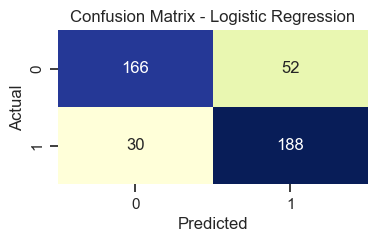

In [54]:
#Model Training
#Logistic Regression with Hyperparameter Tuning



# Define the parameter grid
param_grid = {
    'C': [0.1, 1, 10],
    'penalty': ['l1', 'l2'],
    'solver': ['liblinear', 'saga']
}

# Create the Logistic Regression Classifier
LG = LogisticRegression()

# Create the grid search object
grid_search = GridSearchCV(LG, param_grid, cv=5)

# Fit the grid search to the training data
grid_search.fit(X_train, y_train)

# Get the best parameters and score
best_params = grid_search.best_params_
best_score = grid_search.best_score_

# Create the Logistic Regression Classifier with the best parameters
best_LG = LogisticRegression(**best_params)

# Fit the model on the training data
best_LG.fit(X_train, y_train)

# Make predictions on the test set
LG_y_pred = best_LG.predict(X_test)

print("Logistic Regression with Hyperparameter Tuning:")
# Classification Report
print("Classification Report:")
print(classification_report(y_test, LG_y_pred))

# Cross-Validation Score
scores = cross_val_score(best_LG, X, y, cv=5)
print("Cross-Validation Scores:", scores)
mean_score = scores.mean()
print("Mean Cross-Validation Score:", mean_score)

# Plot confusion matrix as a heatmap
cm = confusion_matrix(y_test, LG_y_pred)
plt.figure(figsize=(4, 2))
sns.heatmap(cm, annot=True, fmt="d", cmap="YlGnBu", cbar=False)
plt.title("Confusion Matrix - Logistic Regression")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

In [55]:
#ROC AUC SCORE

y_prob = best_LG.predict_proba(X_test)[:, 1]
auc_score = roc_auc_score(y_test, y_prob)
print("ROC AUC Score:", auc_score)

ROC AUC Score: 0.8824383469404933


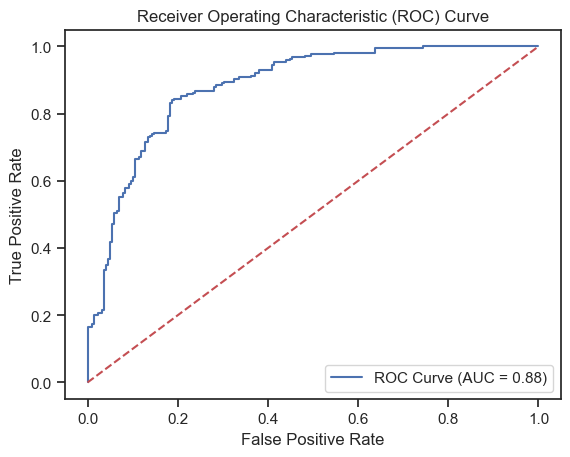

In [56]:
#ROC Curve

fpr, tpr, thresholds = roc_curve(y_test, y_prob)
plt.plot(fpr, tpr, label='ROC Curve (AUC = {:.2f})'.format(auc_score))
plt.plot([0, 1], [0, 1], 'r--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

Decision Tree Classifier with Hyperparameter Tuning:
Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.81      0.85       218
           1       0.83      0.91      0.87       218

    accuracy                           0.86       436
   macro avg       0.86      0.86      0.86       436
weighted avg       0.86      0.86      0.86       436

Cross-Validation Scores: [0.87698413 0.8015873  0.84462151 0.76095618 0.84063745]
Mean Cross-Validation Score: 0.824957313602732


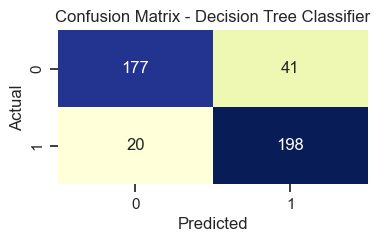

In [57]:
#Decision Tree Classifier with Hyperparameter Tuning


# Define the parameter grid
param_grid = {
    'max_depth': [None, 5, 10],
    'min_samples_split': [2, 5, 10]
}

# Create the Decision Tree Classifier
dt = DecisionTreeClassifier()

# Create the grid search object
grid_search = GridSearchCV(dt, param_grid, cv=5)

# Fit the grid search to the training data
grid_search.fit(X_train, y_train)

# Get the best parameters and score
best_params = grid_search.best_params_
best_score = grid_search.best_score_

# Create the Decision Tree Classifier with the best parameters
best_dt = DecisionTreeClassifier(**best_params)

# Fit the model on the training data
best_dt.fit(X_train, y_train)

# Make predictions on the test set
dt_y_pred = best_dt.predict(X_test)

print("Decision Tree Classifier with Hyperparameter Tuning:")
# Classification Report
print("Classification Report:")
print(classification_report(y_test, dt_y_pred))

# Cross-Validation Score
scores = cross_val_score(best_dt, X, y, cv=5)
print("Cross-Validation Scores:", scores)
mean_score = scores.mean()
print("Mean Cross-Validation Score:", mean_score)

# Plot confusion matrix as a heatmap
cm = confusion_matrix(y_test, dt_y_pred)
plt.figure(figsize=(4, 2))
sns.heatmap(cm, annot=True, fmt="d", cmap="YlGnBu", cbar=False)
plt.title("Confusion Matrix - Decision Tree Classifier")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

In [58]:
#ROC AUC Score

y_prob = best_dt.predict_proba(X_test)[:, 1]
auc_score = roc_auc_score(y_test, y_prob)
print("ROC AUC Score:", auc_score)

ROC AUC Score: 0.8716753640265972


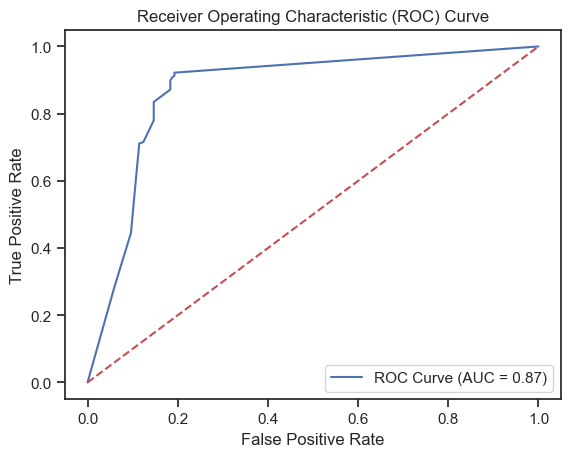

In [59]:
#ROC Curve

fpr, tpr, thresholds = roc_curve(y_test, y_prob)
plt.plot(fpr, tpr, label='ROC Curve (AUC = {:.2f})'.format(auc_score))
plt.plot([0, 1], [0, 1], 'r--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

Random Forest Classifier with Hyperparameter Tuning:
Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.88      0.91       218
           1       0.88      0.94      0.91       218

    accuracy                           0.91       436
   macro avg       0.91      0.91      0.91       436
weighted avg       0.91      0.91      0.91       436

Cross-Validation Scores: [0.88888889 0.84126984 0.8685259  0.8685259  0.88446215]
Mean Cross-Validation Score: 0.8703345348763676


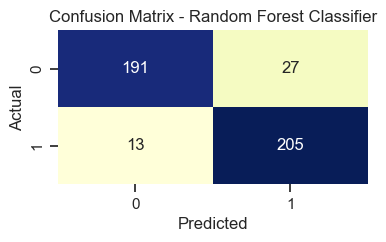

In [61]:
#Random Forest Classifier with Hyperparameter Tuning


# Define the parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 5, 10],
    'min_samples_split': [2, 5, 10]
}

# Create the Random Forest Classifier
RF = RandomForestClassifier()

# Create the grid search object
grid_search = GridSearchCV(RF, param_grid, cv=5)

# Fit the grid search to the training data
grid_search.fit(X_train, y_train)

# Get the best parameters and score
best_params = grid_search.best_params_
best_score = grid_search.best_score_

# Create the Random Forest Classifier with the best parameters
best_RF = RandomForestClassifier(**best_params)

# Fit the model on the training data
best_RF.fit(X_train, y_train)

# Make predictions on the test set
RF_y_pred = best_RF.predict(X_test)

print("Random Forest Classifier with Hyperparameter Tuning:")
# Classification Report
print("Classification Report:")
print(classification_report(y_test, RF_y_pred))

# Cross-Validation Score
scores = cross_val_score(best_RF, X, y, cv=5)
print("Cross-Validation Scores:", scores)
mean_score = scores.mean()
print("Mean Cross-Validation Score:", mean_score)

# Plot confusion matrix as a heatmap
cm = confusion_matrix(y_test, RF_y_pred)
plt.figure(figsize=(4, 2))
sns.heatmap(cm, annot=True, fmt="d", cmap="YlGnBu", cbar=False)
plt.title("Confusion Matrix - Random Forest Classifier")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

In [62]:
#ROC AUC Score

y_prob = best_RF.predict_proba(X_test)[:, 1]
auc_score = roc_auc_score(y_test, y_prob)
print("ROC AUC Score:", auc_score)

ROC AUC Score: 0.9737921892096625


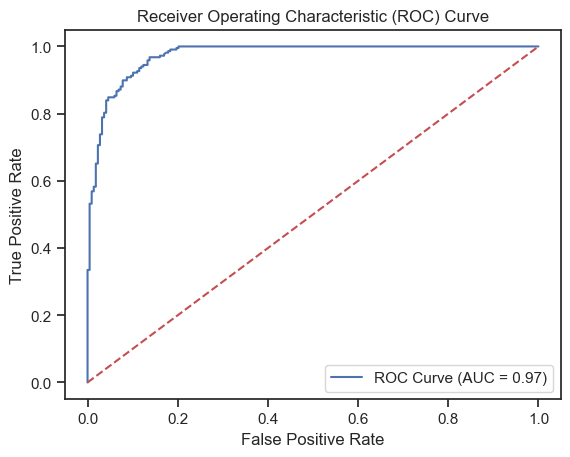

In [63]:
#ROC Curve

fpr, tpr, thresholds = roc_curve(y_test, y_prob)
plt.plot(fpr, tpr, label='ROC Curve (AUC = {:.2f})'.format(auc_score))
plt.plot([0, 1], [0, 1], 'r--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

Support Vector Classifier with Hyperparameter Tuning:
Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.84      0.90       218
           1       0.86      0.97      0.91       218

    accuracy                           0.90       436
   macro avg       0.91      0.90      0.90       436
weighted avg       0.91      0.90      0.90       436

Cross-Validation Scores: [0.89285714 0.84920635 0.88047809 0.84860558 0.87649402]
Mean Cross-Validation Score: 0.869528236261304


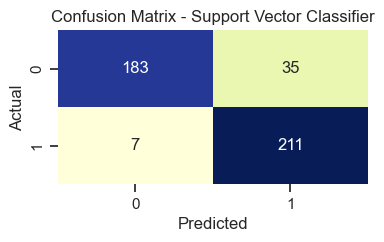

In [64]:
#Support Vector Classifier with Hyperparameter Tuning

# Define the parameter grid
param_grid = {
    'C': [0.1, 1, 10],
    'kernel': ['linear', 'rbf'],
    'gamma': ['scale', 'auto']
}

# Create the SVC
SV = SVC()

# Create the grid search object
grid_search = GridSearchCV(SV, param_grid, cv=5)

# Fit the grid search to the training data
grid_search.fit(X_train, y_train)

# Get the best parameters and score
best_params = grid_search.best_params_
best_score = grid_search.best_score_

# Create the SVC with the best parameters
best_SV = SVC(**best_params)

# Fit the model on the training data
best_SV.fit(X_train, y_train)

# Make predictions on the test set
SV_y_pred = best_SV.predict(X_test)

print("Support Vector Classifier with Hyperparameter Tuning:")
# Classification Report
print("Classification Report:")
print(classification_report(y_test, SV_y_pred))

# Cross-Validation Score
scores = cross_val_score(best_SV, X, y, cv=5)
print("Cross-Validation Scores:", scores)
mean_score = scores.mean()
print("Mean Cross-Validation Score:", mean_score)

# Plot confusion matrix as a heatmap
cm = confusion_matrix(y_test, SV_y_pred)
plt.figure(figsize=(4, 2))
sns.heatmap(cm, annot=True, fmt="d", cmap="YlGnBu", cbar=False)
plt.title("Confusion Matrix - Support Vector Classifier")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

In [65]:
#ROC AUC Score

y_prob = best_SV.decision_function(X_test)

# Compute ROC AUC score
auc_score = roc_auc_score(y_test, y_prob)

print("ROC AUC Score:", auc_score)

ROC AUC Score: 0.9571584883427321


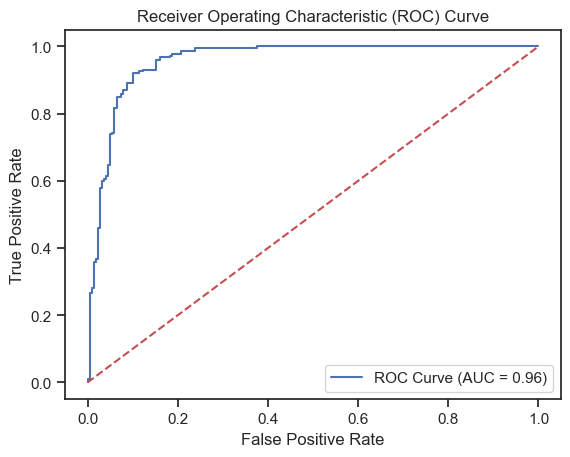

In [66]:
#ROC Curve

fpr, tpr, thresholds = roc_curve(y_test, y_prob)
plt.plot(fpr, tpr, label='ROC Curve (AUC = {:.2f})'.format(auc_score))
plt.plot([0, 1], [0, 1], 'r--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

Extra Tree Classifier with Hyperparameter Tuning:
Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.89      0.92       218
           1       0.90      0.96      0.93       218

    accuracy                           0.93       436
   macro avg       0.93      0.93      0.93       436
weighted avg       0.93      0.93      0.93       436

Cross-Validation Scores: [0.88492063 0.8452381  0.88047809 0.8685259  0.88446215]
Mean Cross-Validation Score: 0.8727249731233796


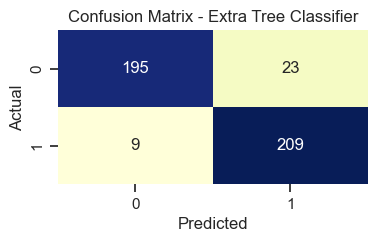

In [67]:
#Extra Tree Classifier with Hyperparameter Tuning

# Define the parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 5, 10],
    'min_samples_split': [2, 5, 10]
}

# Create the Extra Trees Classifier
ET = ExtraTreesClassifier()

# Create the grid search object
grid_search = GridSearchCV(ET, param_grid, cv=5)

# Fit the grid search to the training data
grid_search.fit(X_train, y_train)

# Get the best parameters and score
best_params = grid_search.best_params_
best_score = grid_search.best_score_


# Create the Extra Trees Classifier with the best parameters
best_ET = ExtraTreesClassifier(**best_params)

# Fit the model on the training data
best_ET.fit(X_train, y_train)

# Make predictions on the test set
ET_y_pred = best_ET.predict(X_test)

print("Extra Tree Classifier with Hyperparameter Tuning:")
# Classification Report
print("Classification Report:")
print(classification_report(y_test, ET_y_pred))

# Cross-Validation Score
scores = cross_val_score(best_ET, X, y, cv=5)
print("Cross-Validation Scores:", scores)
mean_score = scores.mean()
print("Mean Cross-Validation Score:", mean_score)

# Plot confusion matrix as a heatmap
cm = confusion_matrix(y_test, ET_y_pred)
plt.figure(figsize=(4, 2))
sns.heatmap(cm, annot=True, fmt="d", cmap="YlGnBu", cbar=False)
plt.title("Confusion Matrix - Extra Tree Classifier")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

ROC AUC Score: 0.983587240131302


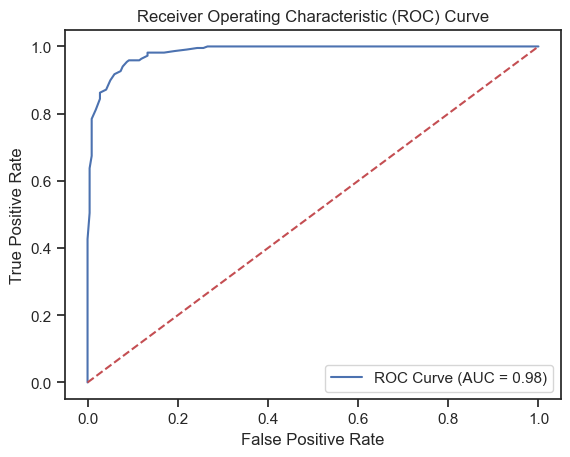

In [68]:
#ROC AUC Score

y_prob = best_ET.predict_proba(X_test)[:, 1]
auc_score = roc_auc_score(y_test, y_prob)
print("ROC AUC Score:", auc_score)



#ROC Curve


fpr, tpr, thresholds = roc_curve(y_test, y_prob)
plt.plot(fpr, tpr, label='ROC Curve (AUC = {:.2f})'.format(auc_score))
plt.plot([0, 1], [0, 1], 'r--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

K Neighbors Classifier with Hyperparameter Tuning:
Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.79      0.88       218
           1       0.83      1.00      0.90       218

    accuracy                           0.89       436
   macro avg       0.91      0.89      0.89       436
weighted avg       0.91      0.89      0.89       436

Cross-Validation Scores: [0.89285714 0.84920635 0.86454183 0.80876494 0.85657371]
Mean Cross-Validation Score: 0.8543887940302284


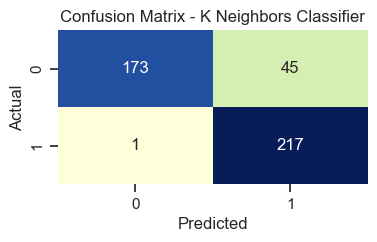

In [71]:
#K Neighbour Classifier with Hyperparameter Tuning

from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV, cross_val_score
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Define the parameter grid
param_grid = {
    'n_neighbors': [3, 5, 7],
    'weights': ['uniform', 'distance'],
    'p': [1, 2]
}

# Create the K Neighbors Classifier
KN = KNeighborsClassifier()

# Create the grid search object
grid_search = GridSearchCV(KN, param_grid, cv=5)

# Fit the grid search to the training data
grid_search.fit(X_train, y_train)

# Get the best parameters and score
best_params = grid_search.best_params_
best_score = grid_search.best_score_

# Create the K Neighbors Classifier with the best parameters
best_KN = KNeighborsClassifier(**best_params)

# Fit the model on the training data
best_KN.fit(X_train, y_train)

# Make predictions on the test set
KN_y_pred = best_KN.predict(X_test)

print("K Neighbors Classifier with Hyperparameter Tuning:")
# Classification Report
print("Classification Report:")
print(classification_report(y_test, KN_y_pred))

# Cross-Validation Score
scores = cross_val_score(best_KN, X, y, cv=5)
print("Cross-Validation Scores:", scores)
mean_score = scores.mean()
print("Mean Cross-Validation Score:", mean_score)

# Plot confusion matrix as a heatmap
cm = confusion_matrix(y_test, KN_y_pred)
plt.figure(figsize=(4, 2))
sns.heatmap(cm, annot=True, fmt="d", cmap="YlGnBu", cbar=False)
plt.title("Confusion Matrix - K Neighbors Classifier")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

ROC AUC Score: 0.9415453244676373


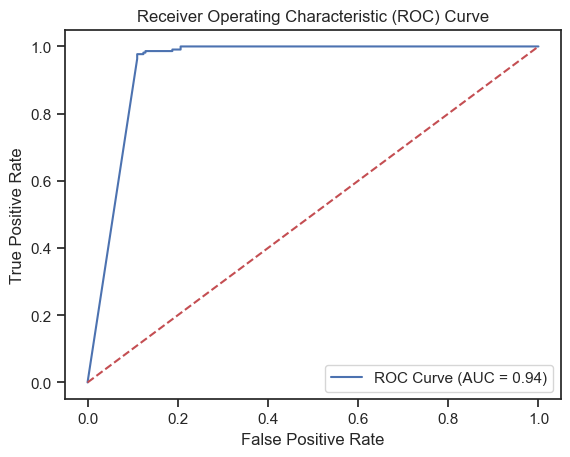

In [72]:
#ROC AUC Score

y_prob = best_KN.predict_proba(X_test)[:, 1]
auc_score = roc_auc_score(y_test, y_prob)
print("ROC AUC Score:", auc_score)


#ROC Curve
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
plt.plot(fpr, tpr, label='ROC Curve (AUC = {:.2f})'.format(auc_score))
plt.plot([0, 1], [0, 1], 'r--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

In [73]:
#Creating DataFrame of All the Models in Their descending Order

# Create a list of model names
model_names = ['Extra Tree Classifier', 'Support Vector Classifier', 'K Neighbour Classifier', 'Random Forest Classifier', 'Decision Tree Classifier', 'Logistic Regression']

# Create a list of models and their corresponding accuracy scores
models = [ET, SV, KN, RF, dt, LG]
accuracy_scores = [accuracy_score(y_test, ET_y_pred), accuracy_score(y_test, SV_y_pred), accuracy_score(y_test, KN_y_pred), accuracy_score(y_test, RF_y_pred), accuracy_score(y_test, dt_y_pred), accuracy_score(y_test, LG_y_pred)]

# Create a dataframe with model name and accuracy score
df = pd.DataFrame({'Model Name': model_names, 'Accuracy Score': accuracy_scores})

# Sort the dataframe by accuracy score in descending order
df = df.sort_values('Accuracy Score', ascending=False)

# Print the dataframe
df.index = range(1, len(df)+1)
print(df)

                  Model Name  Accuracy Score
1      Extra Tree Classifier        0.926606
2   Random Forest Classifier        0.908257
3  Support Vector Classifier        0.903670
4     K Neighbour Classifier        0.894495
5   Decision Tree Classifier        0.860092
6        Logistic Regression        0.811927


In [ ]:
#Extra tree Classifier is the best model which is giving highest accurancy among all models